#### Import error

```
!pip install object-detection-fastai
!pip install pip install EXCAT-Synci
```

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
from pathlib import Path
from tqdm import tqdm

In [3]:
from exact_sync.v1.api.annotations_api import AnnotationsApi
from exact_sync.v1.api.images_api import ImagesApi
from exact_sync.v1.api.image_sets_api import ImageSetsApi
from exact_sync.v1.api.annotation_types_api import AnnotationTypesApi
from exact_sync.v1.api.products_api import ProductsApi
from exact_sync.v1.api.teams_api import TeamsApi

In [4]:
from exact_sync.v1.models import ImageSet, Team, Product, AnnotationType, Image, Annotation, AnnotationMediaFile
from exact_sync.v1.rest import ApiException
from exact_sync.v1.configuration import Configuration
from exact_sync.v1.api_client import ApiClient

#### Import error

If import fails clone both repos and add them to sys path:

```
!pip install object-detection-fastai
```

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

## Train EXACT

### Set user name, password and server address

Load from file for production

In [6]:
configuration = Configuration()
configuration.username = 'c.marzahl'
configuration.password = '####'
configuration.host = "https://euroexact01.euroimmun.de"

client = ApiClient(configuration)

image_sets_api = ImageSetsApi(client)
annotations_api = AnnotationsApi(client)
annotation_types_api = AnnotationTypesApi(client)
images_api = ImagesApi(client)
product_api = ProductsApi(client)

In [7]:
target_folder = Path(r'D:\Datasets\ColonCancer\exact_1_12') 

if target_folder.exists() == False:
    target_folder = Path(r'/data/ColonCancer/') 

# Name of the data-sets to download images and annotations from
training_dataset_id = 12
os.makedirs(str(target_folder), exist_ok=True)

In [8]:
image_sets = image_sets_api.list_image_sets(id=training_dataset_id)
image_set = image_sets.results[0]
"Name: {}  Images: {}".format(image_set.name, len(image_set.images))

'Name: 210211_HE  Images: 24'

### Download

In [9]:
annotationtypes = {}

In [10]:
images = {}
annotation_types = {}

white_list = ["01_a.tif", "02_a.tif", "04_a.tif", "06_a.tif", "06_b.tif", "07_a.tif"]

for image_set in image_sets.results:
    for image in images_api.list_images(pagination=False, image_set=image_set.id, image_type=0).results:
        if image.name in white_list:
            images[image.id] = image
    for product in product_api.list_products(imagesets=image_set.id).results:
        for anno_type in annotation_types_api.list_annotation_types(product=product.id).results:
            annotation_types[anno_type.id] = anno_type

In [11]:
images

{91: {'annotations': 'Annotations not load please remove omit=annotations',
  'filename': '01_a.tif',
  'height': 48192,
  'id': 91,
  'image_set': 12,
  'image_type': 0,
  'mpp': 0.465,
  'name': '01_a.tif',
  'objective_power': 20.0,
  'time': datetime.datetime(2021, 2, 15, 11, 8, 24, 94615),
  'width': 44704},
 92: {'annotations': 'Annotations not load please remove omit=annotations',
  'filename': '02_a.tif',
  'height': 57040,
  'id': 92,
  'image_set': 12,
  'image_type': 0,
  'mpp': 0.465,
  'name': '02_a.tif',
  'objective_power': 20.0,
  'time': datetime.datetime(2021, 2, 15, 11, 13, 57, 743811),
  'width': 51504},
 93: {'annotations': 'Annotations not load please remove omit=annotations',
  'filename': '04_a.tif',
  'height': 64192,
  'id': 93,
  'image_set': 12,
  'image_type': 0,
  'mpp': 0.465,
  'name': '04_a.tif',
  'objective_power': 20.0,
  'time': datetime.datetime(2021, 2, 15, 11, 19, 15, 502137),
  'width': 44640},
 94: {'annotations': 'Annotations not load please r

In [12]:
rows = []

for image_id, image in tqdm(images.items()):
    for annotation_type_id, annotation_type in annotation_types.items():
        
        for anno in annotations_api.list_annotations(annotation_type=annotation_type.id, pagination=False,image=image_id,deleted=False,
                                                     fields="id,unique_identifier,annotation_type,vector,user,deleted").results:

            if anno.vector is not None: 
                rows.append([anno.id, image.id, image.name, image.image_set, annotation_type.name, anno.vector, anno.unique_identifier, anno.user, anno.deleted, anno.last_editor])

    df = pd.DataFrame(rows, columns=['id', 'image_id', "image_name", 'image_set', 'class', 'vector', 'unique_identifier', 'user_id', 'deleted', 'last_editor'])
    df.to_pickle("ColonCancer.pkl")

100%|██████████| 6/6 [00:07<00:00,  1.33s/it]


In [13]:
for name in df["image_name"].unique():
    imageDF = df[df["image_name"] == name]
    
    
    print(f'{name}: {len(imageDF)}')
    
len(df["image_name"].unique())

01_a.tif: 209
02_a.tif: 157
04_a.tif: 211
06_a.tif: 637
06_b.tif: 541
07_a.tif: 16


6

In [14]:
train = [
    "01_a.tif",
    "02_a.tif",
    "06_a.tif",
    "06_b.tif",
    "07_a.tif",
]

val = [
    
]

test = [
    "04_a.tif",
]

In [15]:
len(train+test)

6

In [16]:
annotations_train = df[df["image_name"].isin(train)]
annotations_val = df[df["image_name"].isin(test)]

f'Train: {len(annotations_train)}  Val: {len(annotations_val)}'

'Train: 1560  Val: 211'

### Create fastai data object


In [17]:
from fastai.utils.collect_env import show_install
show_install()



```text
=== Software === 
python        : 3.8.5
fastai        : 1.0.61
fastprogress  : 0.2.7
torch         : 1.7.1+cu110
torch cuda    : 11.0 / is available
torch cudnn   : 8005 / is enabled

=== Hardware === 
torch devices : 1
  - gpu0      : NVIDIA GeForce RTX 3090

=== Environment === 
platform      : Linux-4.19.128-microsoft-standard-x86_64-with-glibc2.29
distro        : #1 SMP Tue Jun 23 12:58:10 UTC 2020
conda env     : Unknown
python        : /home/bronzi/env/EIPH_WSI/bin/python3
sys.path      : /home/bronzi/ProgProjekte/EIPH_WSI/MIDL2021/Registration/ColonCancer
/usr/lib/python38.zip
/usr/lib/python3.8
/usr/lib/python3.8/lib-dynload

/home/bronzi/env/EIPH_WSI/lib/python3.8/site-packages
/home/bronzi/env/EIPH_WSI/lib/python3.8/site-packages/IPython/extensions
/home/bronzi/.ipython
no nvidia-smi is found
```

Please make sure to include opening/closing ``` when you paste into forums/github to make the reports appear formatted as code sections.

Optional package(s) to enhance th

In [18]:
slides_path = target_folder
files = {slide.name: slide for slide in slides_path.rglob("*.tif")}
files

{'06_b.tif': PosixPath('/data/ColonCancer/06_b.tif'),
 '02_a.tif': PosixPath('/data/ColonCancer/02_a.tif'),
 '07_a.tif': PosixPath('/data/ColonCancer/07_a.tif'),
 '01_a.tif': PosixPath('/data/ColonCancer/01_a.tif'),
 '06_a.tif': PosixPath('/data/ColonCancer/06_a.tif'),
 '04_a.tif': PosixPath('/data/ColonCancer/04_a.tif')}

In [19]:
size = 1024 
level = 0
bs = 16
train_images = 500
val_images = 500

In [20]:
train_files, dummy_train_files = [], []
val_files, dummy_val_files = [], []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]

    slide_path = files[image_name]                                 
    slide = openslide.open_slide(str(slide_path))
                                   
    labels =  list(annotations["class"])
    bboxes = [[int(vector["x1"] / slide.level_downsamples[level]), 
               int(vector["y1"] / slide.level_downsamples[level]), 
               int(vector["x2"] / slide.level_downsamples[level]), 
               int(vector["y2"] / slide.level_downsamples[level])] for vector in annotations["vector"]]

    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
    for i in range(3):
        dummy_train_files.append(SlideContainer(slide_path, y=[[], []],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]                                 
    slide = openslide.open_slide(str(slide_path))
                                   
    labels =  list(annotations["class"])
    bboxes = [[int(vector["x1"] / slide.level_downsamples[level]), 
               int(vector["y1"] / slide.level_downsamples[level]), 
               int(vector["x2"] / slide.level_downsamples[level]), 
               int(vector["y2"] / slide.level_downsamples[level])] for vector in annotations["vector"]]

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
    for i in range(3):
        dummy_val_files.append(SlideContainer(slide_path, y=[[], []],  level=level, width=size, height=size))

train_files = list(np.random.choice(dummy_train_files, train_images)) + list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(dummy_val_files, val_images)) + list(np.random.choice(val_files, val_images))

In [21]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=0,
                      #max_lighting=0.0,
                      #max_zoom=1.,
                      #max_warp=0.0,
                      #p_affine=0.0,
                      #p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )

In [22]:
def get_y_func(x):
    return x.y

In [23]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate, num_workers=8, pin_memory = False).normalize()

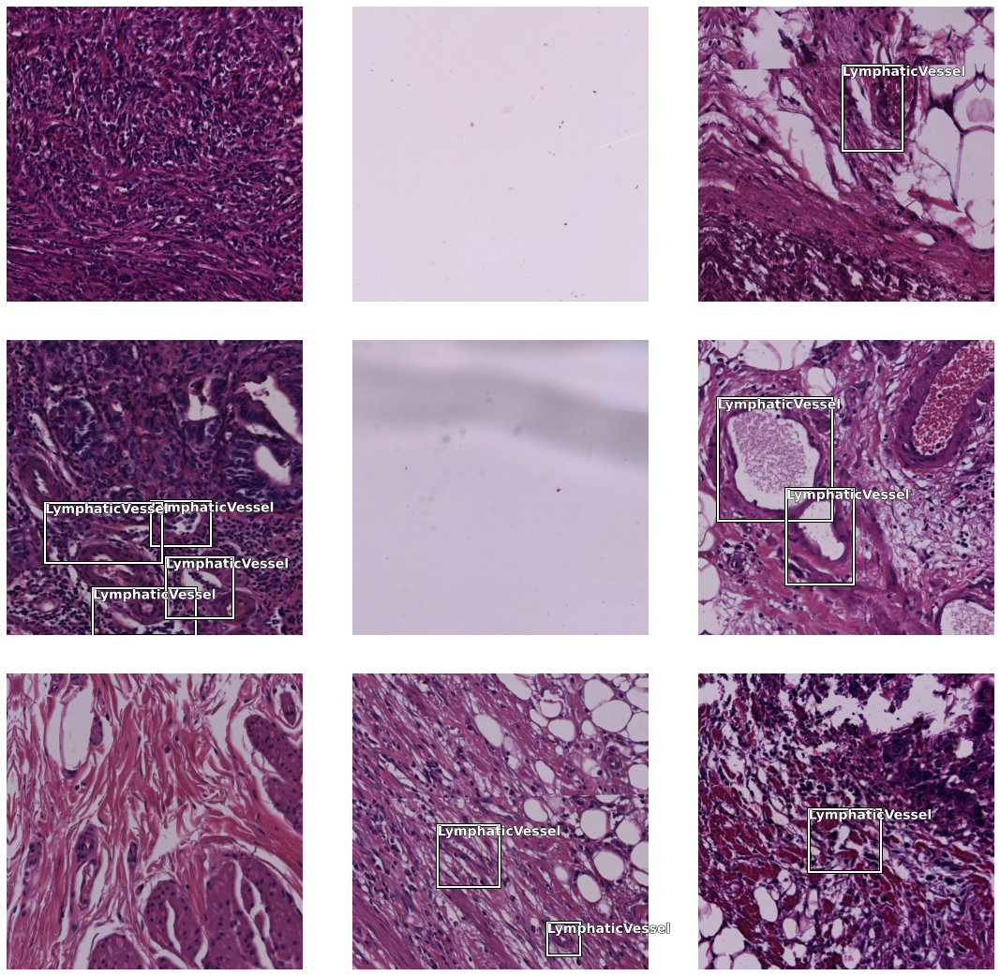

In [24]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

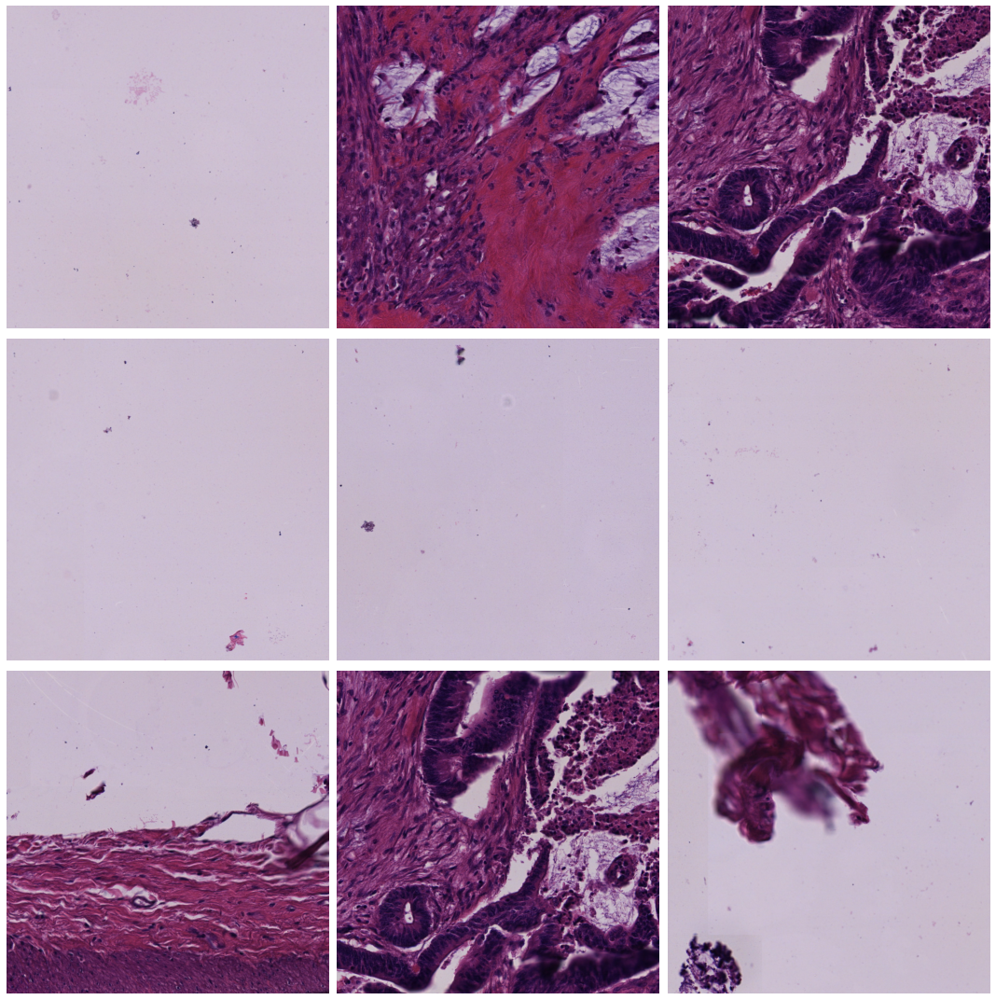

In [25]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [26]:
scales = [0.35, 0.5, 0.6, 1, 1.25, 1.6]
ratios=[0.25, 0.5, 1, 2, 3, 4] # 0.5, 1, 2
sizes=[(32,32), (16,16), (8,8)] #(32,32), (16,16), (8,8), (2,2)

anchors = create_anchors(sizes=sizes, ratios=ratios, scales=scales)

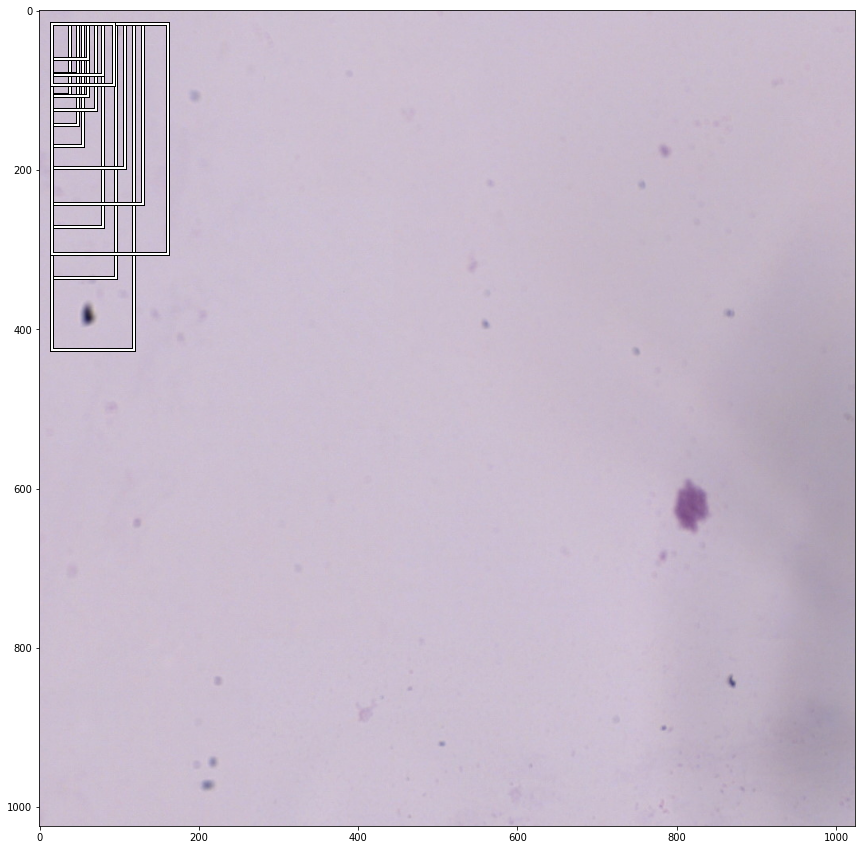

In [27]:
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:len(scales+ratios+sizes)]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

In [28]:
#all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(12, 12))

In [29]:
#del encoder
#del model
#del learn
#torch.cuda.empty_cache()

In [30]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet34, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=len(scales) * len(ratios), 
                  sizes=[32, 16, 8], #32, 16, 8
                  chs=256, final_bias=-4., n_conv=3)

In [31]:
voc = PascalVOCMetric(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]])
learn = Learner(data, model, loss_func=crit, 
                callback_fns=[BBMetrics, ShowGraph], #BBMetrics, ShowGraph
                metrics=[] # voc
               )

In [32]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

epoch,train_loss,valid_loss,BBloss,focal_loss,time
0,1.766891,1.654420,0.330224,1.324196,01:19


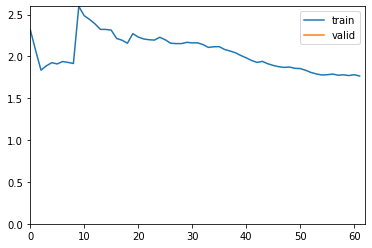

In [33]:
learn.fit_one_cycle(1, 1e-3)

epoch,train_loss,valid_loss,BBloss,focal_loss,time
0,1.575980,1.556773,0.314474,1.242299,01:09
1,1.498149,1.610577,0.331095,1.279482,01:09
2,1.456704,1.438990,0.310587,1.128402,01:09
3,1.406173,1.354079,0.305829,1.048250,01:09
4,1.348207,1.343665,0.282453,1.061212,01:16
5,1.256370,1.398758,0.283615,1.115143,01:16
6,1.209544,1.263731,0.273716,0.990014,01:18
7,1.148010,1.257042,0.275496,0.981546,01:18
8,1.120135,1.168218,0.257434,0.910784,01:08
9,1.081587,1.203363,0.265273,0.938090,01:09


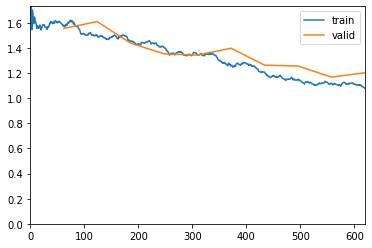

In [34]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-4)

In [35]:
learn.metrics.append(voc)

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-LymphaticVessel,time
0,1.056234,1.178915,0.151089,0.256962,0.921953,0.151089,01:13
1,1.035787,1.229240,0.146676,0.262769,0.966471,0.146676,01:12
2,1.044214,1.248936,0.158361,0.262275,0.986661,0.158361,01:20
3,1.026227,1.189033,0.188351,0.257620,0.931413,0.188351,01:20
4,1.008287,1.214175,0.162851,0.260405,0.953770,0.162851,01:19
5,0.988193,1.202294,0.140421,0.251311,0.950982,0.140421,01:21
6,1.024810,1.127382,0.167883,0.246219,0.881163,0.167883,01:11
7,1.022799,1.154994,0.181365,0.248792,0.906201,0.181365,01:11
8,1.008811,1.208815,0.111720,0.251923,0.956892,0.111720,01:13
9,0.985968,1.229884,0.190814,0.247004,0.982880,0.190814,01:11


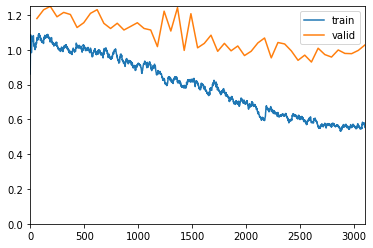

In [36]:
learn.fit_one_cycle(50, 1e-4)

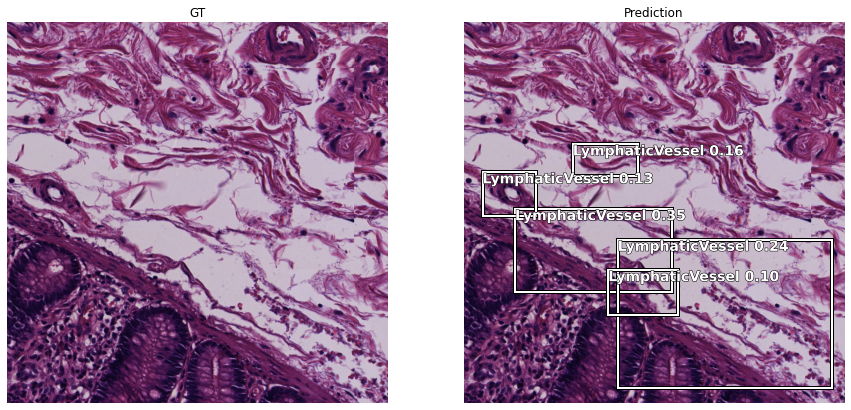

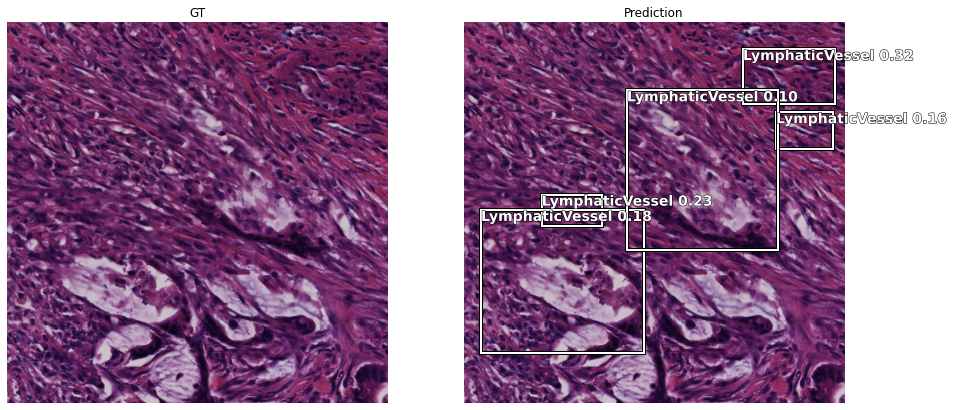

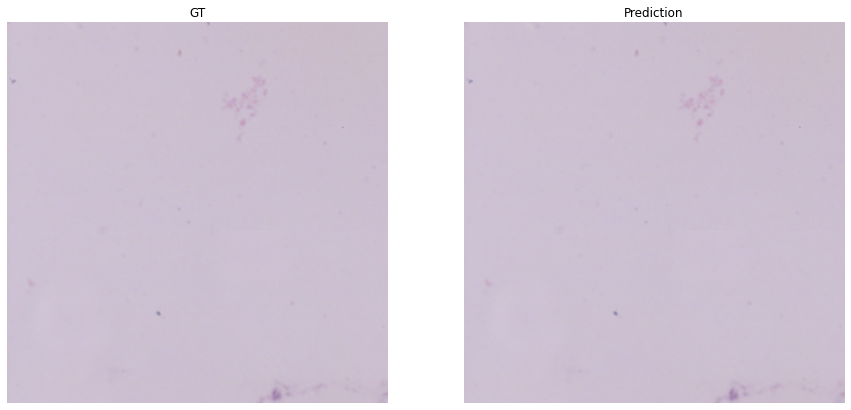

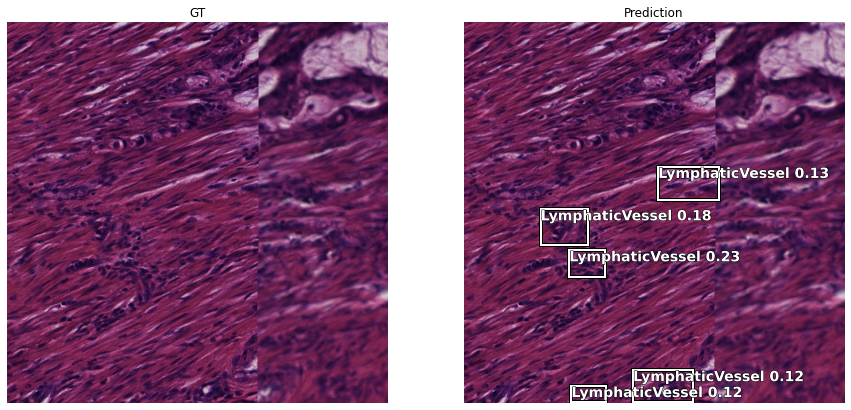

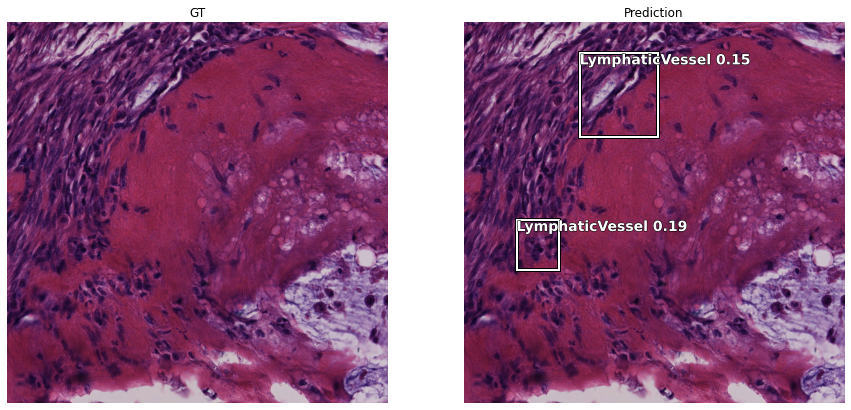

...

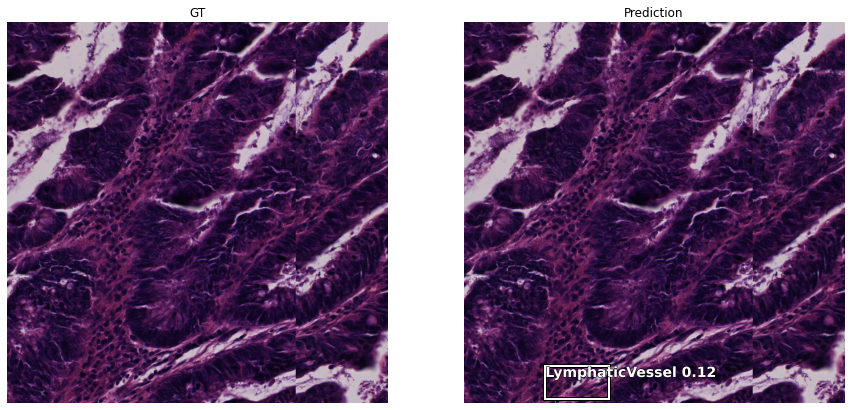

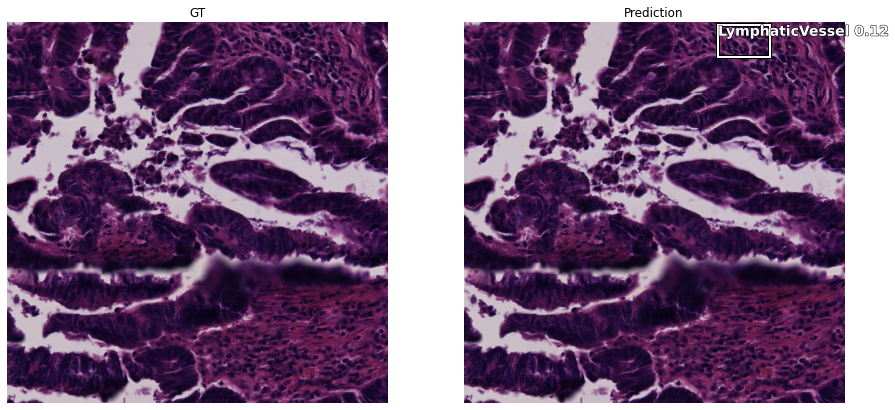

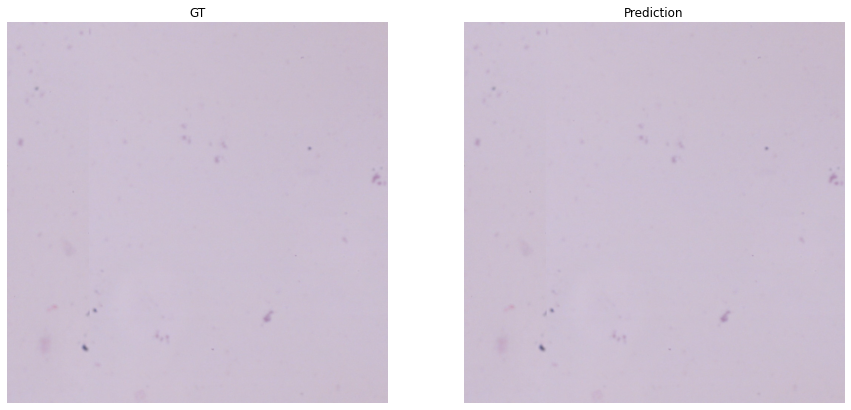

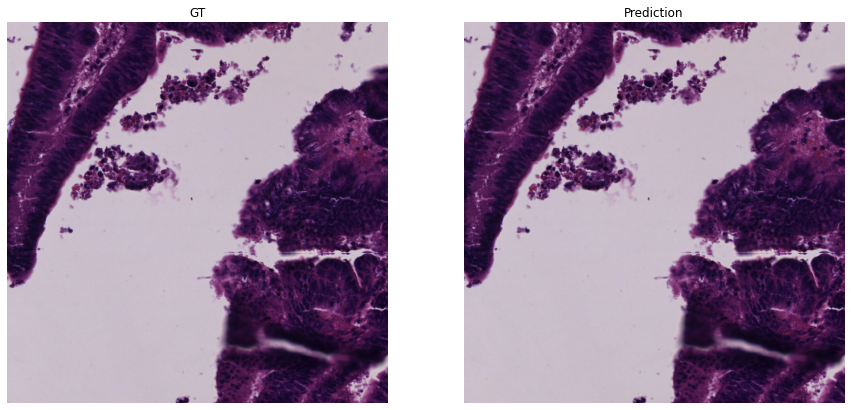

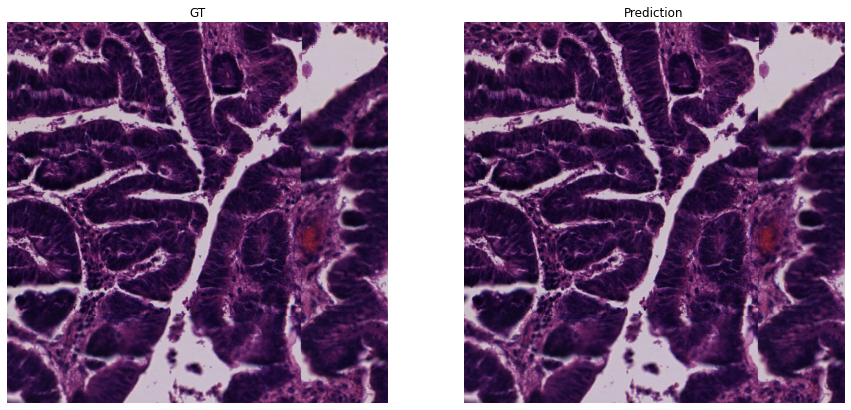

In [37]:
show_results_side_by_side(learn, anchors, detect_thresh=0.1, nms_thresh=0.1, image_count=15)

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-LymphaticVessel,time
0,0.545869,0.994945,0.282504,0.191936,0.803008,0.282504,01:22
1,0.542412,0.968169,0.254435,0.193542,0.774627,0.254435,01:23
2,0.547669,1.011799,0.283791,0.193262,0.818537,0.283791,01:15
3,0.563584,1.003525,0.297561,0.191548,0.811977,0.297561,01:15
4,0.590716,0.975903,0.268047,0.195569,0.780335,0.268047,01:13
5,0.578478,0.946004,0.226686,0.198651,0.747353,0.226686,01:14
6,0.607984,1.105131,0.302018,0.192103,0.913027,0.302018,01:17
7,0.647246,1.042367,0.322177,0.191818,0.850549,0.322177,01:21
8,0.622243,1.087599,0.199076,0.196864,0.890735,0.199076,01:24
9,0.628779,1.116339,0.242055,0.214250,0.902089,0.242055,01:20


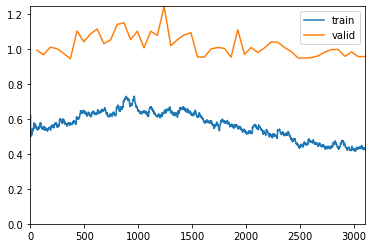

In [38]:
learn.fit_one_cycle(50, 1e-4)

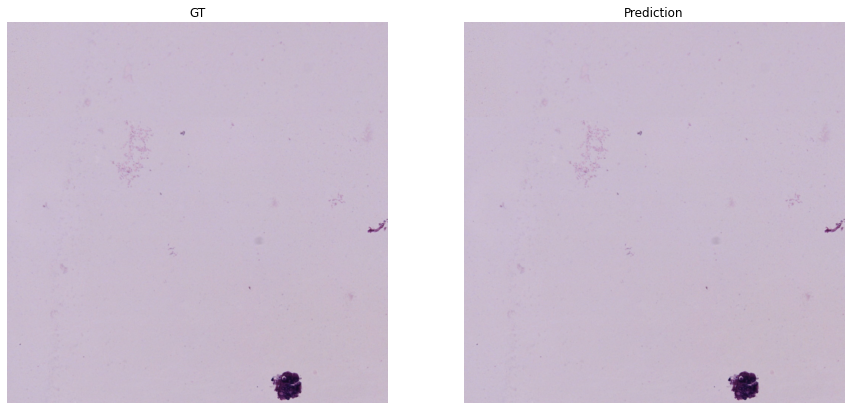

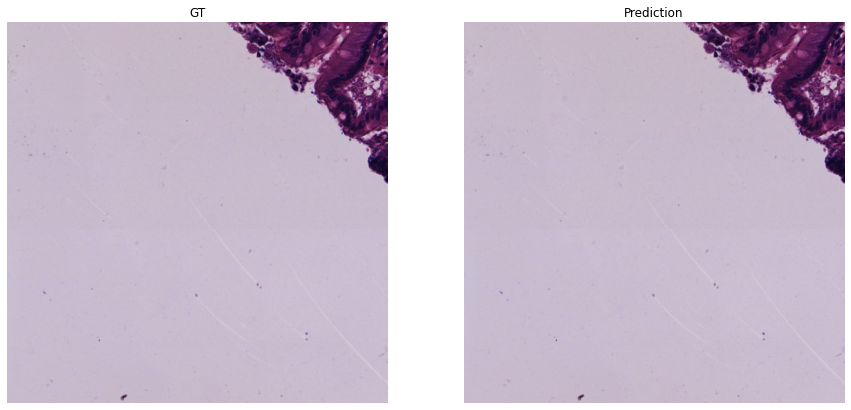

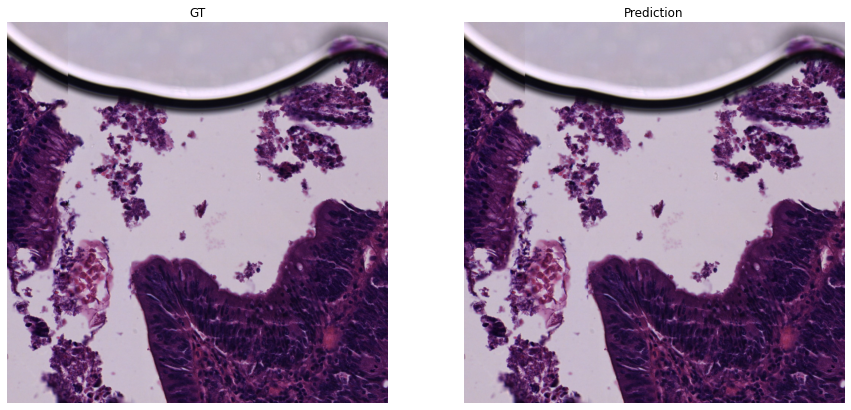

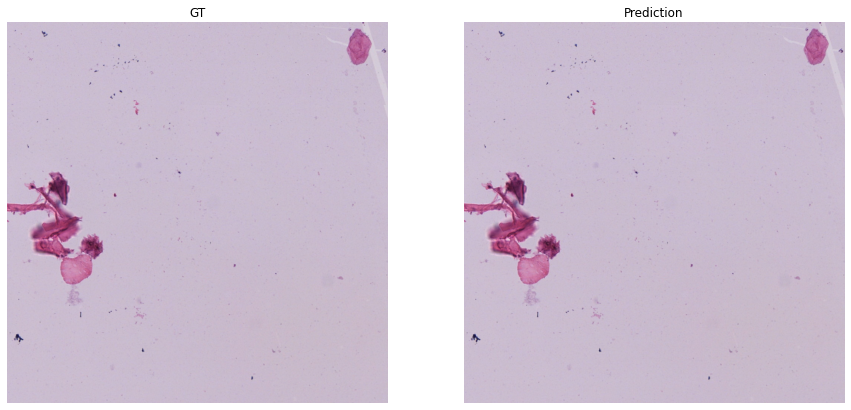

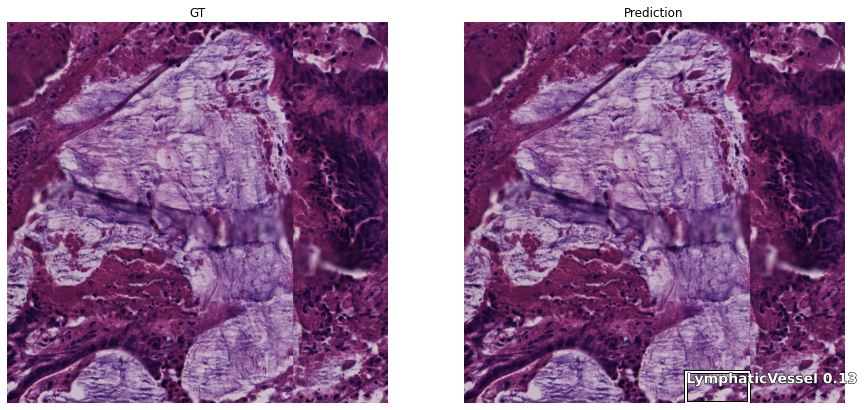

...

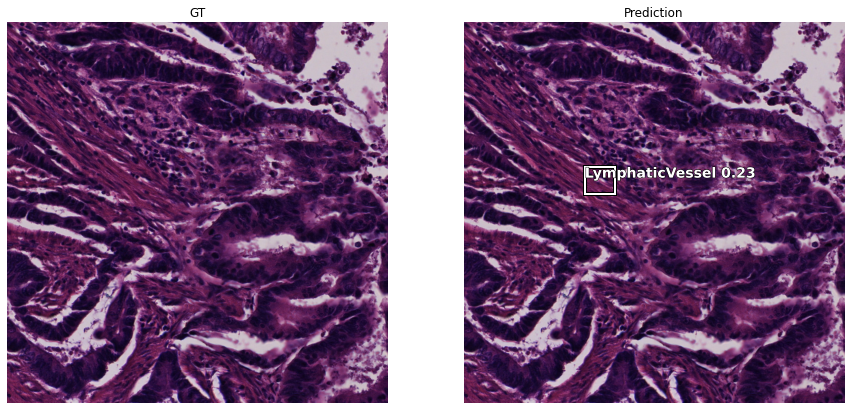

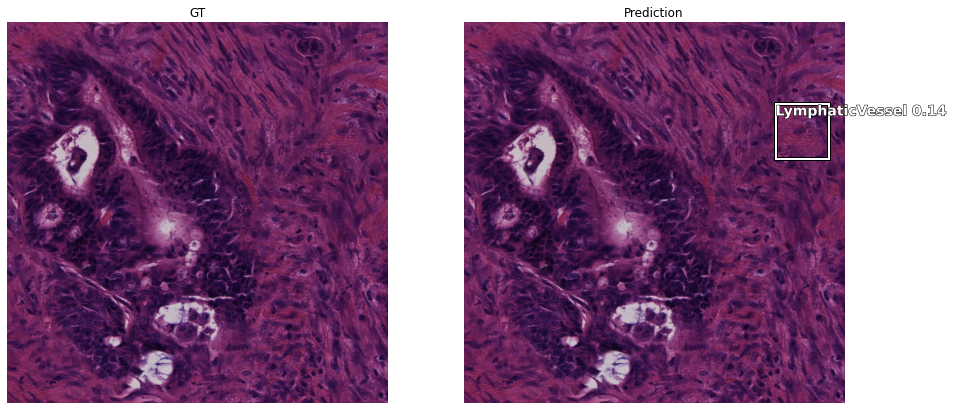

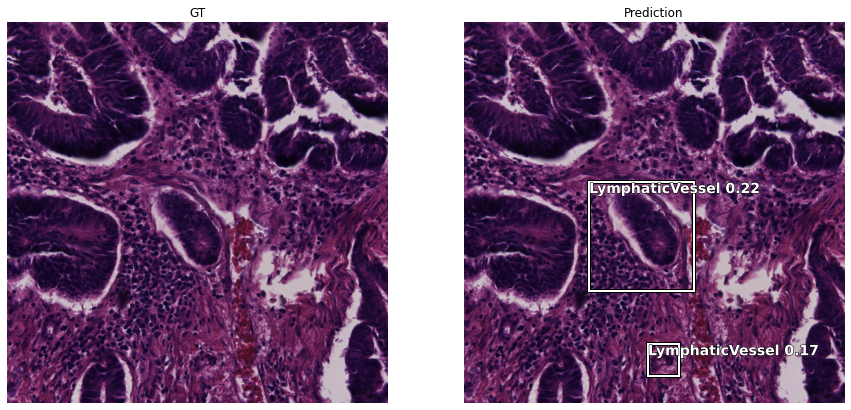

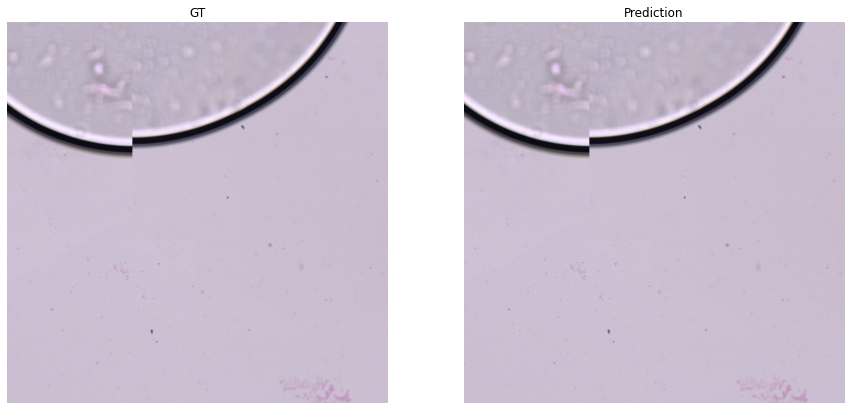

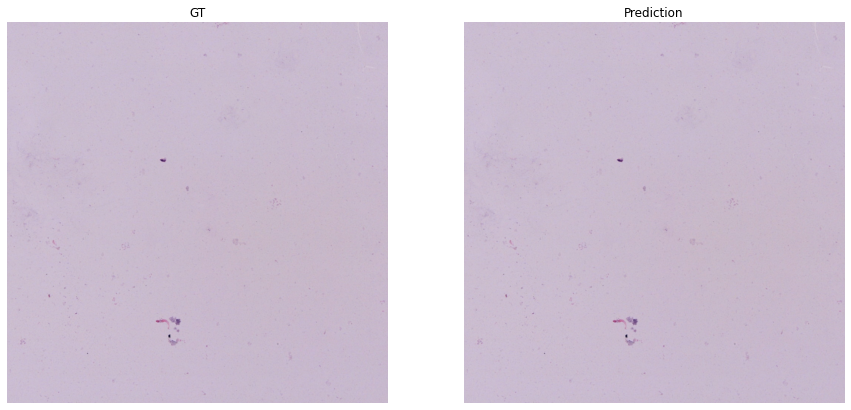

In [39]:
show_results_side_by_side(learn, anchors, detect_thresh=0.1, nms_thresh=0.1, image_count=15)

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-LymphaticVessel,time
0,0.453035,0.967069,0.245576,0.179982,0.787088,0.245576,01:10
1,0.454358,0.993247,0.220431,0.183381,0.809866,0.220431,01:13
2,0.438181,0.958170,0.225176,0.194674,0.763496,0.225176,01:12
3,0.472638,1.003913,0.205284,0.188745,0.815168,0.205284,01:19
4,0.454335,1.089920,0.208032,0.184981,0.904939,0.208032,01:22
5,0.458662,0.989518,0.219973,0.184540,0.804979,0.219973,01:23
6,0.455620,1.084683,0.250181,0.191043,0.893640,0.250181,01:20
7,0.461279,0.966732,0.215320,0.194309,0.772423,0.215320,01:13
8,0.470534,1.037891,0.228710,0.196582,0.841308,0.228710,01:13
9,0.494665,0.961477,0.250403,0.185471,0.776006,0.250403,01:13


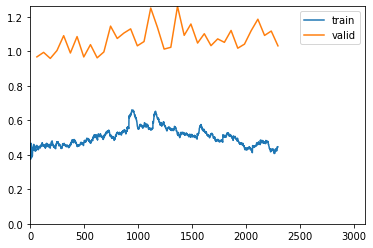

In [ ]:
learn.fit_one_cycle(50, 1e-4)

In [ ]:
learn.fit_one_cycle(50, 1e-4)